In [1]:
%matplotlib inline
import easyaccess as ea
import matplotlib.pyplot as plt
import somsphere
import iso_forest as iso
import pandas as pd
import numpy as np
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
ea.__version__

'1.3.2-dev-8a3e80b'

In [2]:
con=ea.connect()


Connecting to DB ** dessci ** ...


In [3]:
query="""
SELECT 
COADD_OBJECTS_ID,RA,DEC, KRON_RADIUS, 
MAG_DETMODEL_G, MAG_DETMODEL_R, MAG_DETMODEL_I, MAG_DETMODEL_Y, MAG_DETMODEL_Z, 
DESDM_ZP, A_IMAGE, B_IMAGE,MODEST_CLASS 
FROM Y1A1_GOLD SAMPLE(0.4) 
WHERE 
MAG_DETMODEL_I BETWEEN 14.0 and 20 and 
MODEST_CLASS = 1 and 
FLAGS_GOLD = 0 
"""

In [4]:
#df = pd.read_csv('sample_data.csv',sep=',')
df=con.query_to_pandas(query)
df.to_csv('sample_data.csv', sep=',', index=False)
print(len(df))

14334


In [5]:
cols_s="KRON_RADIUS, MAG_DETMODEL_G, MAG_DETMODEL_R, MAG_DETMODEL_I, MAG_DETMODEL_Y, MAG_DETMODEL_Z, DESDM_ZP, A_IMAGE, B_IMAGE"

In [6]:
cols = ''.join(cols_s.split()).split(',')

In [7]:
df1=df[cols]
print(len(df1))

14334


In [8]:
X=df1.values
Y=df1['DESDM_ZP'].values

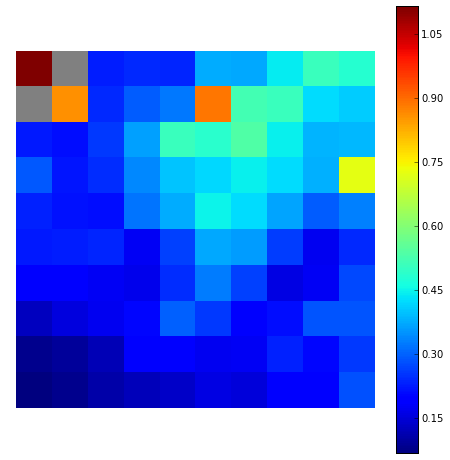

In [21]:
M = somsphere.SelfMap(X, Y ,topology='grid', Ntop=10, iterations=200, periodic='no')
M.create_mapF()
M.evaluate_map()
M.plot_map()

In [24]:
means=[]
for i in range(M.npix):
    try:
        m2= abs(np.mean(M.yvals[i]))
        means.append([m2,int(i), int(len(M.yvals[i]))])
    except:
        pass
means=np.array(means)
s =np.argsort(means[:,0])
means[s][0:2]

array([[  6.86818182e-02,   0.00000000e+00,   3.30000000e+01],
       [  8.26733333e-02,   1.00000000e+00,   7.50000000e+01]])

In [86]:
C=ea.api.DesCoaddCuts(root_url='http://descut.cosmology.illinois.edu')
C.get_token()

Token created, expiration time: 1 hours and 0 minutes


'079d2272dc5225c33a4286875a5fdd322663a49d'

In [26]:
j=s[0]
temp=df.ix[M.ivals[j]]
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job 28f75f03-704a-4b65-b285-28012800b276 submitted.
198 files copied to local server


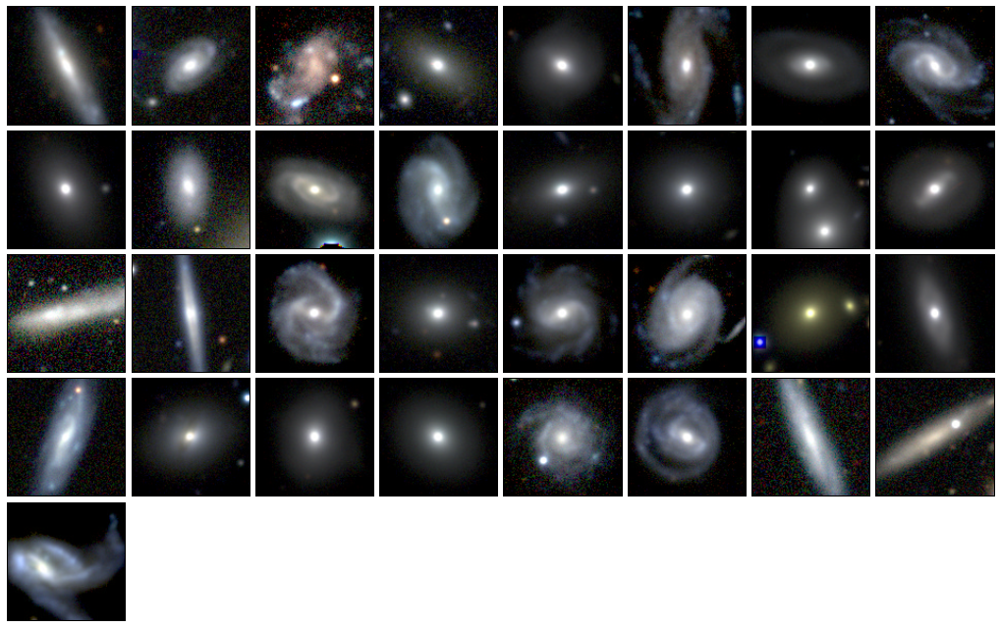

In [27]:
pngs = [i for i in C.files if i.endswith('png')]
fig = plt.figure(figsize=(18, 18))
gs = gridspec.GridSpec(8,8, wspace=0.05, hspace=0.05)
for i in range(len(pngs)):
    pngfile = pngs[i]
    img = mpimg.imread(pngfile)
    ax = plt.subplot(gs[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)

In [28]:
j=s[1]
temp=df.ix[M.ivals[j]]
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job b82ff49e-f9e2-4c50-b776-0eddf0ea4f55 submitted.
450 files copied to local server


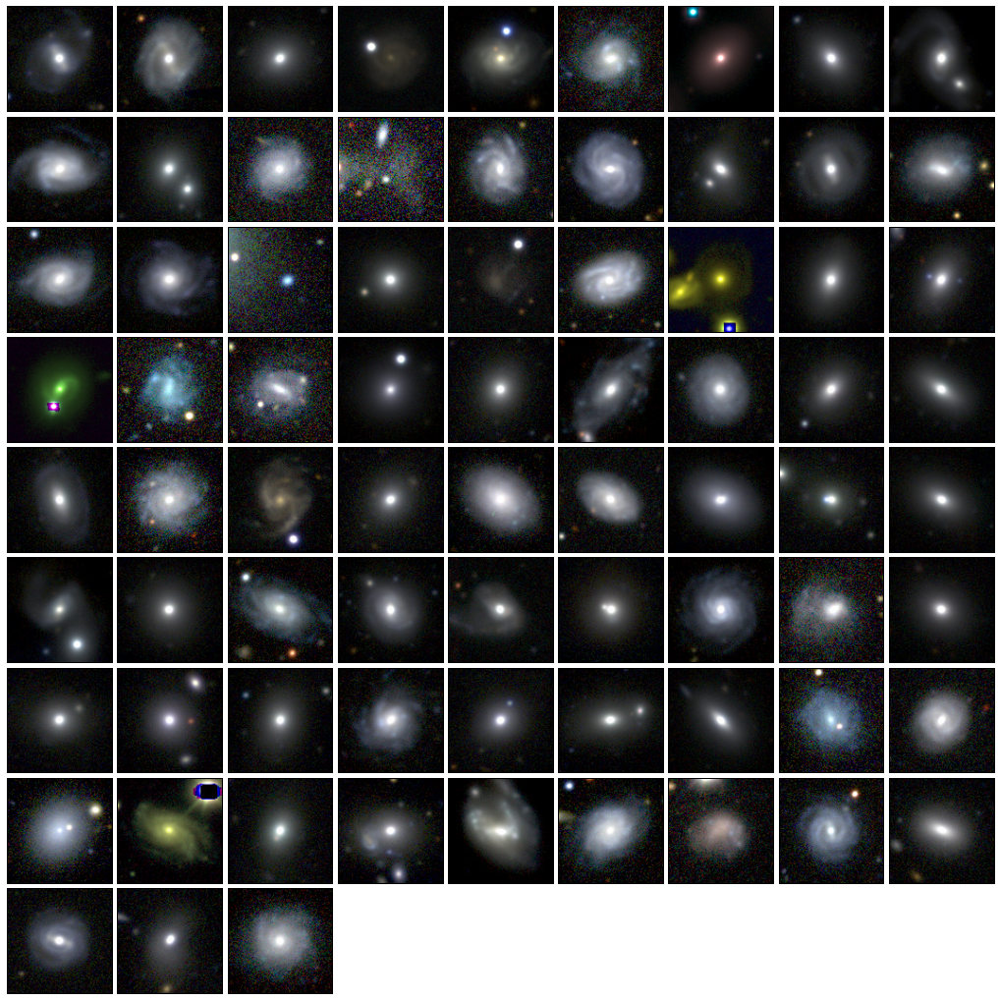

In [29]:
pngs = [i for i in C.files if i.endswith('png')]
fig = plt.figure(figsize=(18, 18))
gs = gridspec.GridSpec(9,9, wspace=0.05, hspace=0.05)
for i in range(len(pngs)):
    pngfile = pngs[i]
    img = mpimg.imread(pngfile)
    ax = plt.subplot(gs[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)

In [30]:
j=s[-5]
temp=df.ix[M.ivals[j]]
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job e47d3adf-1c22-4aa9-b394-dd119f9ceca9 submitted.
876 files copied to local server


146


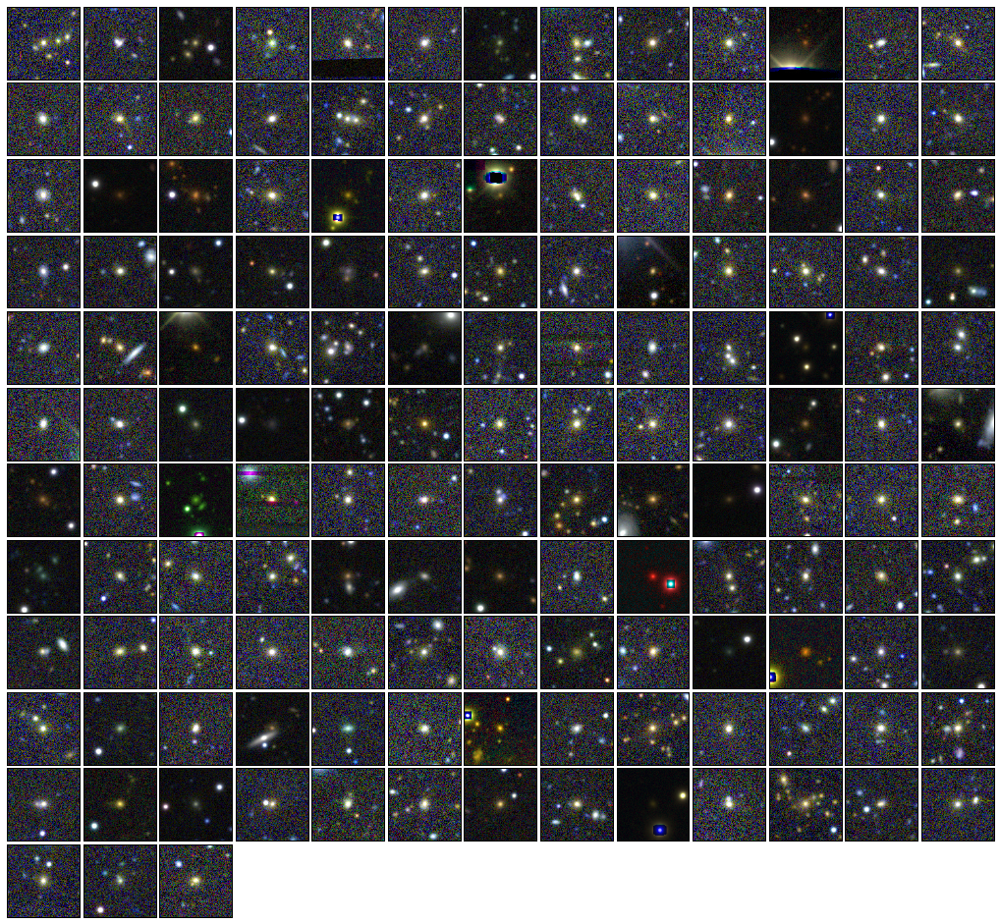

In [34]:
pngs = [i for i in C.files if i.endswith('png')]
fig = plt.figure(figsize=(18, 18))
gs = gridspec.GridSpec(13,13, wspace=0.05, hspace=0.05)
print(len(pngs))
for i in range(len(pngs)):
    pngfile = pngs[i]
    img = mpimg.imread(pngfile)
    ax = plt.subplot(gs[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)

In [35]:
j=s[-1]
temp=df.ix[M.ivals[j]]
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job 94abf363-fc44-4df8-80f1-11c24dc699c6 submitted.
1008 files copied to local server


168


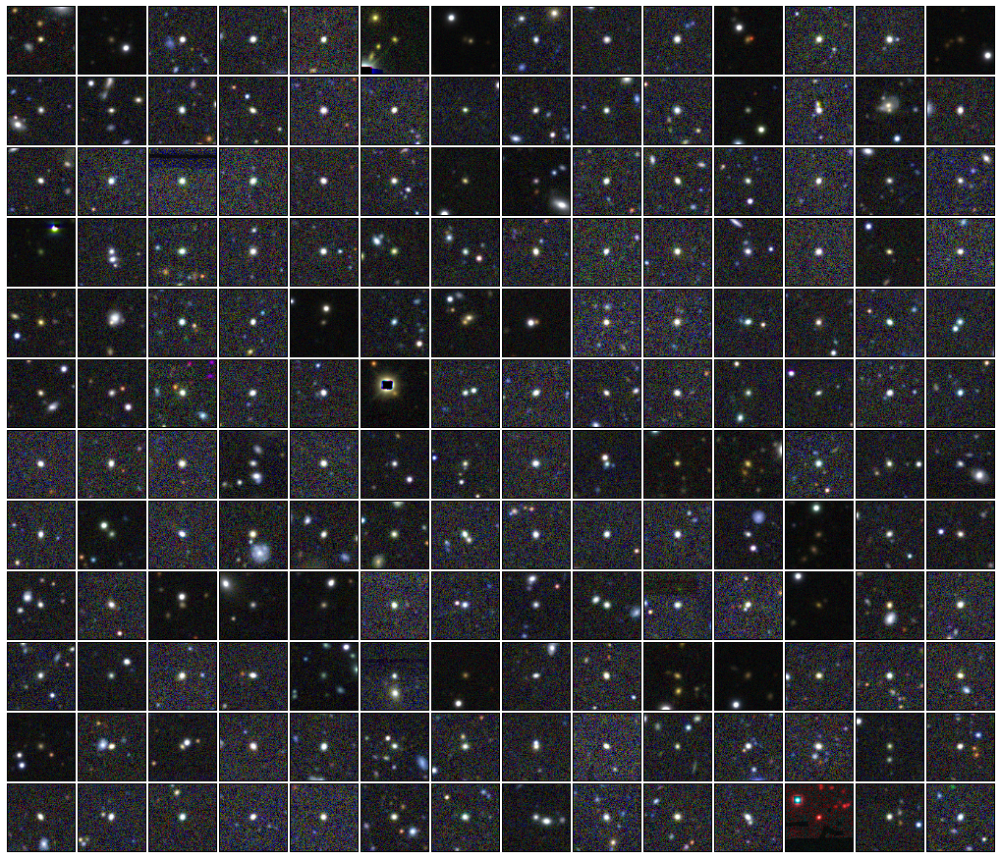

In [41]:
pngs = [i for i in C.files if i.endswith('png')]
print(len(pngs))
fig = plt.figure(figsize=(18, 18))
gs = gridspec.GridSpec(14,14, wspace=0.05, hspace=0.05)
for i in range(len(pngs)):
    pngfile = pngs[i]
    img = mpimg.imread(pngfile)
    ax = plt.subplot(gs[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)

In [42]:
j=s[50]
temp=df.ix[M.ivals[j]]
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job 289d1d0e-f9fb-4449-b716-1c9a9d26cef5 submitted.
1080 files copied to local server


180


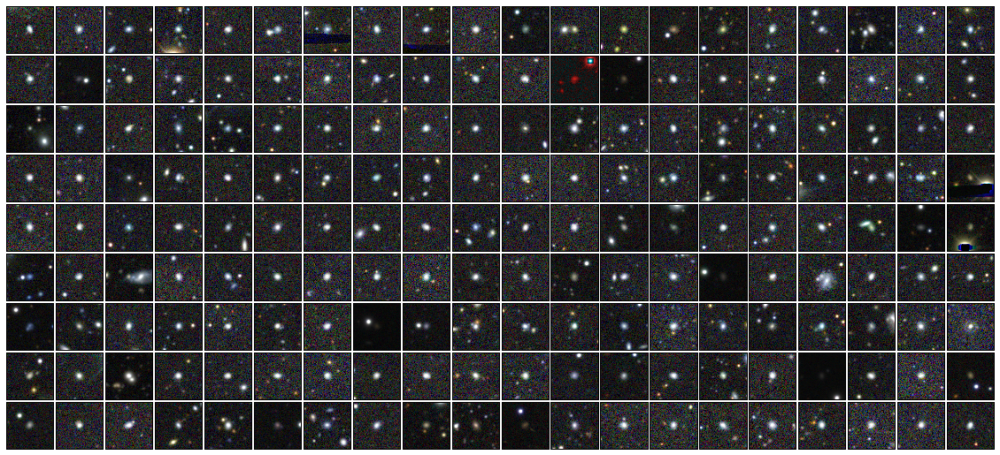

In [45]:
pngs = [i for i in C.files if i.endswith('png')]
print(len(pngs))
fig = plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(20,20, wspace=0.05, hspace=0.05)
for i in range(len(pngs)):
    pngfile = pngs[i]
    img = mpimg.imread(pngfile)
    ax = plt.subplot(gs[i])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)

In [46]:
len(df)

14334

In [47]:
X=df.values

In [48]:
np.shape(X)

(14334, 13)

In [49]:
F = iso.iForest(X,ntrees=1000, sample_size=256)

In [75]:
S=np.zeros(len(X))
for j in range(len(X)):
    try:
        S[j]=F.compute_paths(X_in=X[j:j+1])[0]
    except:
        print(j)

11022
11249
12389
12893
14125


(array([  5.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   9.36000000e+03,
          3.82300000e+03,   7.65000000e+02,   2.77000000e+02,
          1.04000000e+02]),
 array([ 0.        ,  0.07112943,  0.14225887,  0.2133883 ,  0.28451773,
         0.35564717,  0.4267766 ,  0.49790604,  0.56903547,  0.6401649 ,
         0.71129434]),
 <a list of 10 Patch objects>)

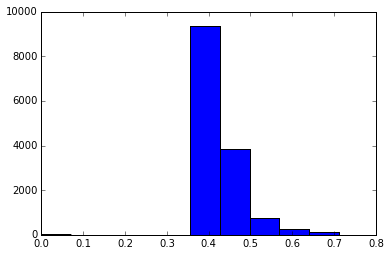

In [77]:
plt.hist(S)

In [79]:
s=np.argsort(S)

In [84]:
temp = df.ix[s[-10:]]

In [85]:
temp

,COADD_OBJECTS_ID,RA,DEC,KRON_RADIUS,MAG_DETMODEL_G,MAG_DETMODEL_R,MAG_DETMODEL_I,MAG_DETMODEL_Y,MAG_DETMODEL_Z,DESDM_ZP,A_IMAGE,B_IMAGE,MODEST_CLASS
10894,3159251935,300.628399,-56.187266,3.5,15.6036,14.7746,14.3244,13.6818,13.9398,0.0536,16.613834,15.771975,1
9721,3034010865,90.271017,-48.370933,3.5,15.8854,15.2494,14.9406,14.5279,14.6755,0.0455,20.853121,20.520252,1
9252,3034413114,90.503096,-58.214906,3.5,15.6522,14.8610,14.4195,13.8896,14.1059,0.0563,19.687340,15.688736,1
12234,3138422506,342.553904,-55.723611,3.5,15.6547,14.7058,14.3276,13.6842,13.9240,0.0696,24.032614,19.455343,1
11984,3144435133,329.290669,-55.428958,3.5,15.7834,14.7851,14.3228,13.7050,13.9302,0.0700,26.095043,20.525217,1
11993,3141241304,338.016609,-54.908225,3.5,15.6485,14.7770,14.3174,13.6936,13.9674,0.0614,24.387383,18.483038,1
14145,3127464887,358.346800,-40.806623,3.5,15.3316,14.7833,14.5422,14.1560,14.3488,0.0474,71.203209,11.503587,1
2619,3125417601,3.017204,-47.296078,3.5,15.0406,14.4768,14.1835,13.7593,13.9539,0.0406,45.351646,24.250748,1
11654,3013626562,346.017269,0.780726,3.5,16.2093,15.6372,15.4002,15.0755,15.2110,0.0505,17.474075,12.877577,1
9445,3157791082,302.796217,-55.623430,3.5,15.6565,15.0517,14.7745,14.4010,14.5404,0.0463,24.116337,21.980473,1


In [87]:
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job 26c7b491-f076-408d-95d4-16ad1b4d6564 submitted.
60 files copied to local server


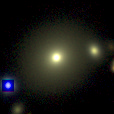

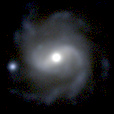

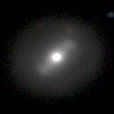

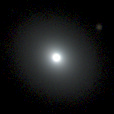

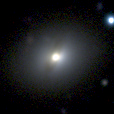

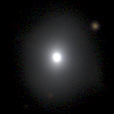

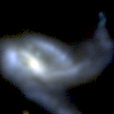

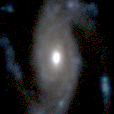

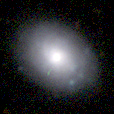

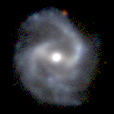

In [88]:
C.show_pngs()

In [89]:
temp = df.ix[s[0:20]]

In [90]:
C.make_cuts(ra=temp.RA, dec=temp.DEC, xsize=0.5, ysize=0.5,wait=True)
C.get_files(folder='demo_example4')

Job 177e9b68-bd58-4383-909f-5f62e292655a submitted.
120 files copied to local server


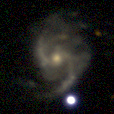

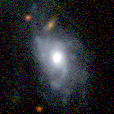

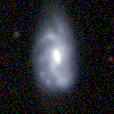

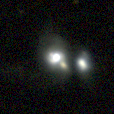

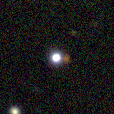

...

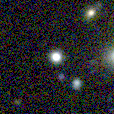

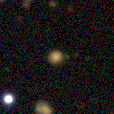

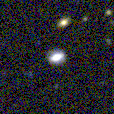

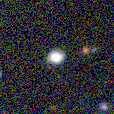

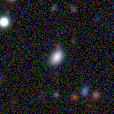

In [91]:
C.show_pngs()